In [1]:
from fastai.vision.core import *
from fastai.vision import *
from fastai.vision.all import *
from pathlib import *
import torch
import os

In [2]:
data= ImageDataLoaders.from_folder(path='./LearningSet_2', train = "train", valid_pct=0.2, item_tfms=Resize(400,ResizeMethod.Squish), bs = 12, num_workers =0)

 Show random elements from data set.

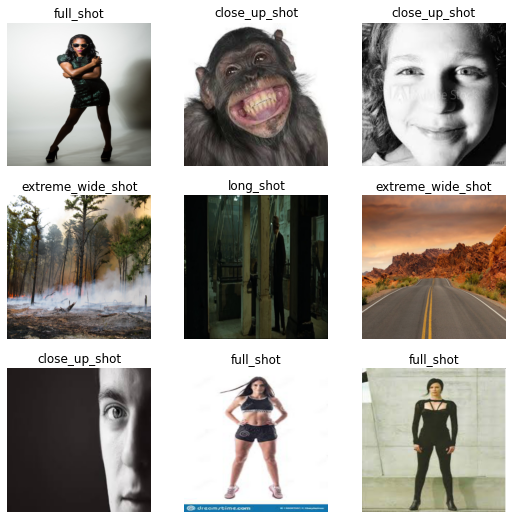

In [3]:
data.show_batch()

In [4]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

SuggestedLRs(lr_min=0.005754399299621582, lr_steep=0.0005754399462603033)

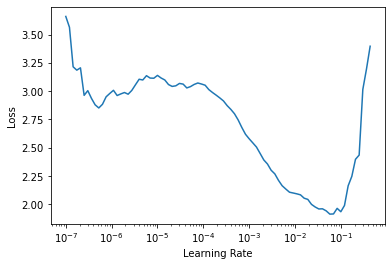

In [5]:
learn.lr_find()

In [8]:
suggested = (0.005754399299621582,0.0005754399462603033)

In [9]:
learn.fit_one_cycle(30, slice(suggested[0], suggested[1]))
#

epoch,train_loss,valid_loss,accuracy,time
0,0.651365,0.355617,0.882124,05:04
1,0.693973,0.391095,0.895078,05:09
2,0.580892,0.332042,0.891192,05:05
3,0.514250,0.316090,0.895078,05:05
4,0.604468,0.394447,0.866580,05:16
5,0.559511,0.292907,0.891192,05:16
6,0.468685,0.360177,0.887306,05:12
7,0.542009,0.375379,0.870466,05:11
8,0.419049,0.421290,0.865285,05:16
9,0.364065,0.415807,0.869171,05:11


In [ ]:
# epoch	train_loss	valid_loss	accuracy	time
# 0	0.712634	0.378508	0.875648	04:16
# 1	0.690157	0.564071	0.805699	04:15
# 2	0.613565	0.371556	0.866580	04:17
# 3	0.455612	0.373452	0.874352	04:18
# 4	0.394648	0.345117	0.892487	04:17
# 5	0.245492	0.327958	0.876943	04:17
# 6	0.210900	0.269956	0.908031	04:17
# 7	0.123444	0.252319	0.915803	04:19
# 8	0.086054	0.246458	0.919689	04:22

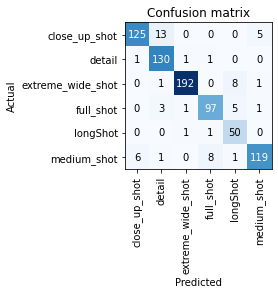

In [10]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [12]:
learn.save('stage1-1')

Path('LearningSet/models/stage1-1.pth')

In [6]:
torch.cuda.empty_cache()

In [16]:
path = 'D:\Programowanie\AI\shot_classifier\LearningSet\models\stage1-1'
learn.load(path)

In [18]:
data= ImageDataLoaders.from_folder(path='./LearningSet', train = "train", valid_pct=0.2, item_tfms=Resize(400,ResizeMethod.Squish), bs = 10, num_workers =0)

In [19]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

In [26]:
learn.unfreeze()

SuggestedLRs(lr_min=0.0033113110810518267, lr_steep=0.0006918309954926372)

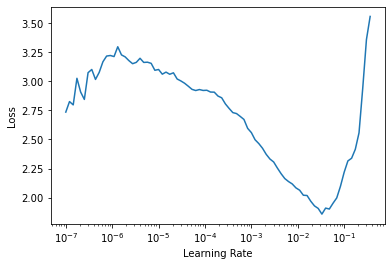

In [20]:
learn.lr_find()

In [22]:
suggested = (0.0033113110810518267, 0.0006918309954926372)

In [23]:
learn.fit_one_cycle(10, slice(suggested[0], suggested[1]))

epoch,train_loss,valid_loss,accuracy,time
0,0.759099,0.340529,0.882124,05:22
1,0.569199,0.347244,0.895078,05:21
2,0.526058,0.342324,0.897668,05:24
3,0.480575,0.290353,0.906736,05:14
4,0.352865,0.324739,0.902850,05:11
5,0.280782,0.287684,0.908031,05:20
6,0.188455,0.274844,0.911917,05:22
7,0.129441,0.281263,0.908031,05:18
8,0.166842,0.268367,0.913212,05:20
9,0.065022,0.261030,0.919689,05:18


In [63]:
learn.save('stage1-2')

Path('LearningSet/models/stage1-2.pth')

In [64]:
torch.cuda.empty_cache()

In [65]:
path = 'D:\Programowanie\AI\shot_classifier\LearningSet\models\stage1-2'
learn.load(path)

In [67]:
data= ImageDataLoaders.from_folder(path='./LearningSet', train = "train", valid_pct=0.2, item_tfms=Resize(BASE_SIZE*5,ResizeMethod.Squish), bs = 11, num_workers =0)
data= data.cuda()

In [68]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

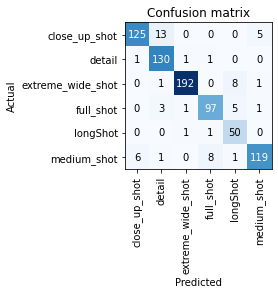

In [11]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

SuggestedLRs(lr_min=0.004786301031708717, lr_steep=1.9054607491852948e-06)

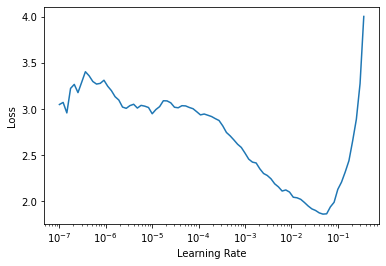

In [69]:
learn.lr_find()

In [ ]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

In [70]:
suggested = (0.004786301031708717, 1.9054607491852948e-06)

In [71]:
learn.fit_one_cycle(8, slice(suggested[0], suggested[1]))

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
torch.cuda.empty_cache()

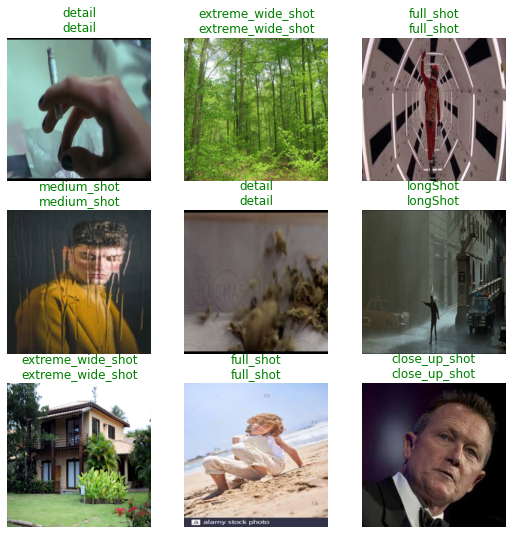

In [43]:
learn.show_results()

In [26]:
# interp.plot_top_losses(9, figsize=(12,6))

Predicting animated models:

In [14]:
learn.export(os.path.abspath('./model.pkl'))

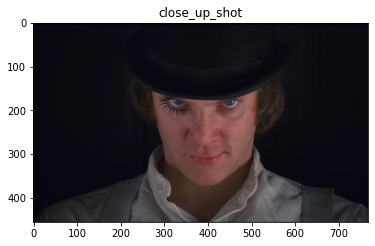

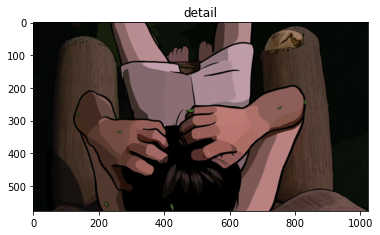

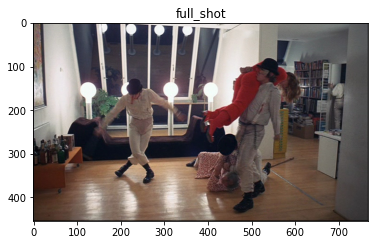

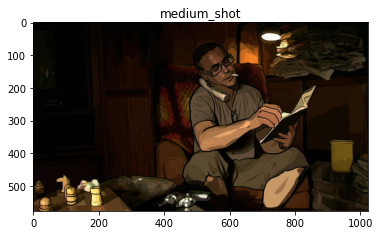

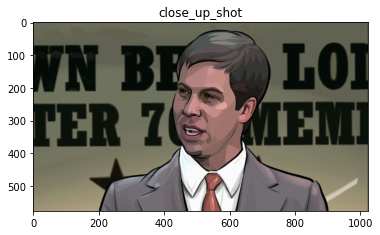

...

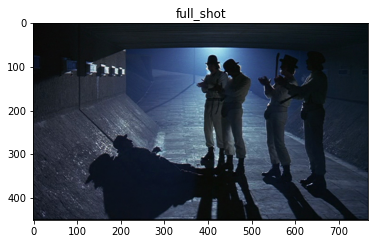

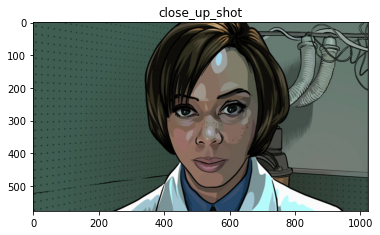

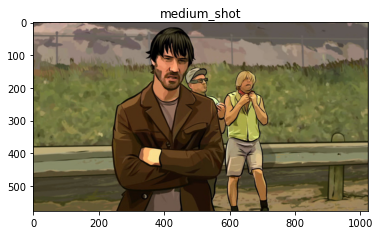

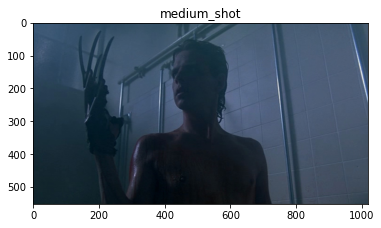

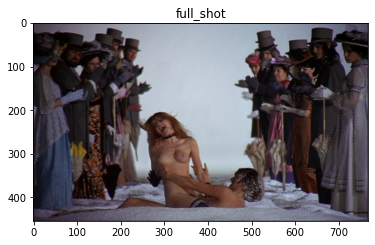

In [13]:
tmp = Path("D:\\Programowanie\\AI\\shot_classifier\\test")
tests = [file for file in tmp.iterdir()]
for file in tests:
    img = Image.open(file)
    plt.figure()
    plt.imshow(img,cmap='magma')
    plt.title(str(learn.predict(file)[0])) 